# EN3160 - Image Processing and Machine Vision
## Assignment 01: Intensity Transformations & Spatial Neighborhood Filtering

Name  - Eranga w.a.o.                                                                                       
Index - 230175U

Github - https://github.com/OshanEranga/Intensity_Transform_and_Neighbor_Filter

In [1]:
# Global Imports and Setups
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import time

# Set matplotlib inline display style
%matplotlib inline
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 10

print("OpenCV Version:", cv2.__version__)
print("NumPy Version :", np.__version__)


OpenCV Version: 5.0.0
NumPy Version : 2.4.2


---
## Question 1: Piecewise-Linear Intensity Transformation

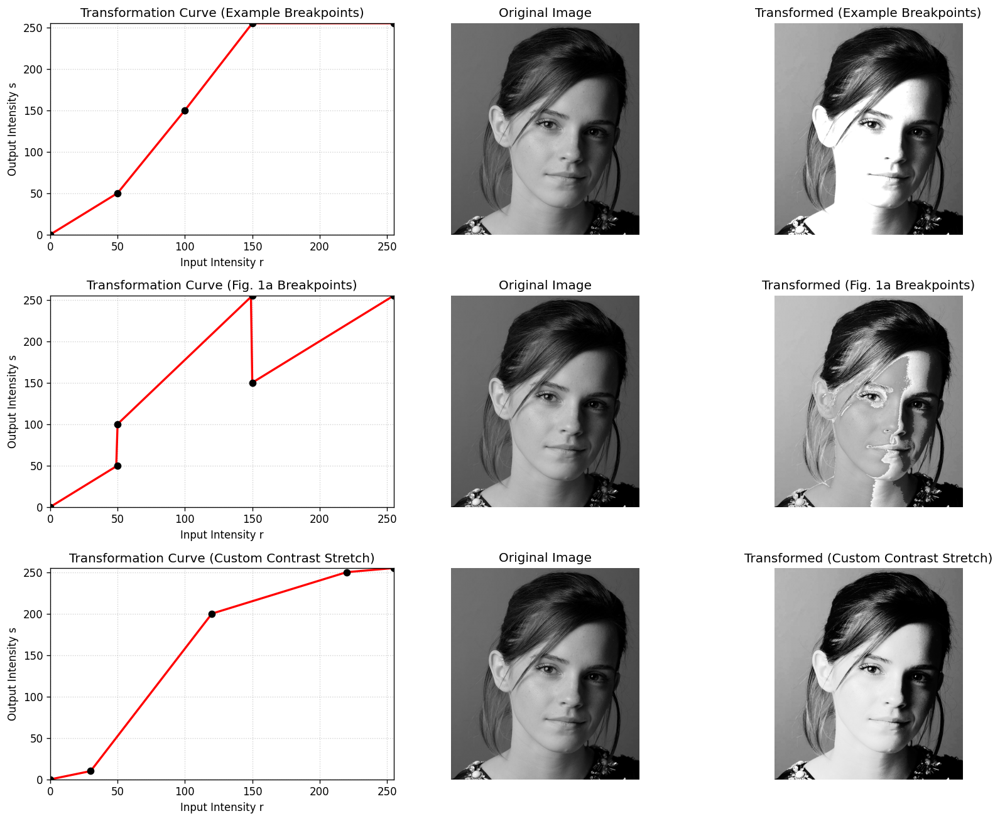

In [2]:
def intensity_transform(im: np.ndarray, breakpoints: np.ndarray) -> np.ndarray:
    breakpoints = np.array(breakpoints, dtype=np.float64)
    r_pts = breakpoints[:, 0]
    s_pts = breakpoints[:, 1]
    
    r_range = np.arange(256, dtype=np.float64)
    lut = np.interp(r_range, r_pts, s_pts)
    lut = np.clip(lut, 0, 255).astype(np.uint8)
    
    im_uint8 = np.clip(im, 0, 255).astype(np.uint8) if im.dtype != np.uint8 else im
    return lut[im_uint8]

fig1_path = os.path.join("images", "Fig1(b).jpeg")
img_q1 = cv2.imread(fig1_path, cv2.IMREAD_GRAYSCALE)

bp_example = [[0, 0], [50, 50], [100, 150], [150, 255], [255, 255]]
bp_fig1a   = [[0, 0], [50, 50], [50, 100], [150, 255], [150, 150], [255, 255]]
bp_custom  = [[0, 0], [30, 10], [120, 200], [220, 250], [255, 255]]

experiments = [
    (bp_example, "Example Breakpoints"),
    (bp_fig1a, "Fig. 1a Breakpoints"),
    (bp_custom, "Custom Contrast Stretch")
]

fig, axes = plt.subplots(3, 3, figsize=(14, 11))
r_range = np.arange(256)

for idx, (bp, title) in enumerate(experiments):
    bp_arr = np.array(bp, dtype=np.float64)
    transformed_im = intensity_transform(img_q1, bp_arr)
    
    s_vals = np.interp(r_range, bp_arr[:, 0], bp_arr[:, 1])
    axes[idx, 0].plot(r_range, s_vals, 'r-', linewidth=2, label='T(r)')
    axes[idx, 0].scatter(bp_arr[:, 0], bp_arr[:, 1], color='black', zorder=5)
    axes[idx, 0].set_title(f'Transformation Curve ({title})')
    axes[idx, 0].set_xlabel('Input Intensity r')
    axes[idx, 0].set_ylabel('Output Intensity s')
    axes[idx, 0].set_xlim([0, 255]); axes[idx, 0].set_ylim([0, 255])
    axes[idx, 0].grid(True, linestyle=':', alpha=0.6)
    
    axes[idx, 1].imshow(img_q1, cmap='gray', vmin=0, vmax=255)
    axes[idx, 1].set_title('Original Image')
    axes[idx, 1].axis('off')
    
    axes[idx, 2].imshow(transformed_im, cmap='gray', vmin=0, vmax=255)
    axes[idx, 2].set_title(f'Transformed ({title})')
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.show()


---
## Question 2: Brain Proton Density MRI Tissue Accentuation

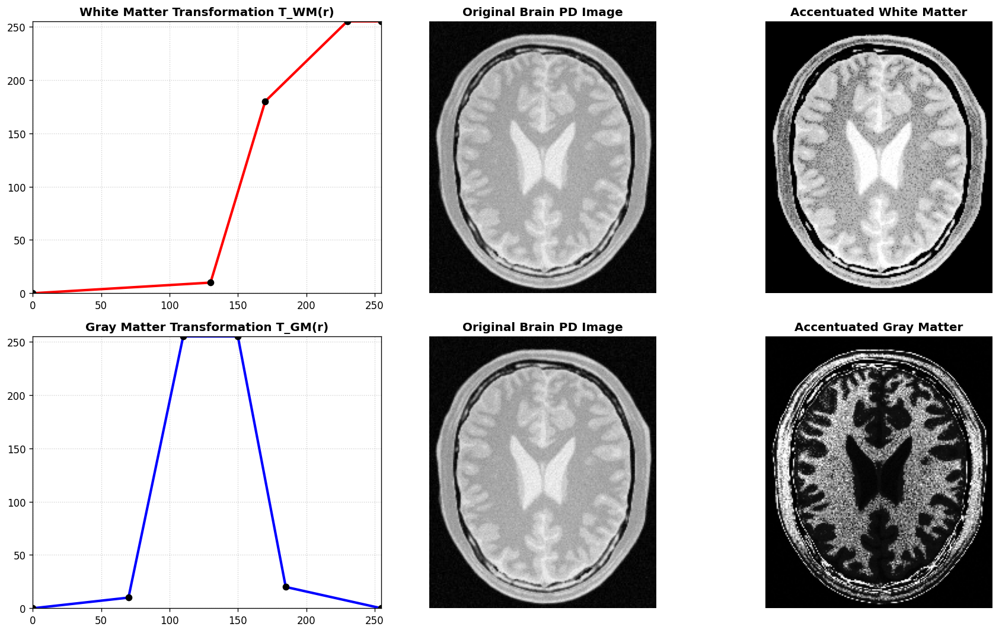

In [3]:
fig2_path = os.path.join("images", "Fig2.jpeg")
im_brain = cv2.imread(fig2_path, cv2.IMREAD_GRAYSCALE)

bp_wm = np.array([[0, 0],[130, 10],[170, 180],[230, 255],[255, 255]])

bp_gm = np.array([[0, 0],[70, 10],[110, 255],[150, 255],[185, 20],[255, 0]])

im_wm = intensity_transform(im_brain, bp_wm)
im_gm = intensity_transform(im_brain, bp_gm)

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
r_range = np.arange(256)

# Row 1: White Matter
s_wm = np.interp(r_range, bp_wm[:, 0], bp_wm[:, 1])
axes[0, 0].plot(r_range, s_wm, 'r-', linewidth=2.5, label='T_WM(r)')
axes[0, 0].scatter(bp_wm[:, 0], bp_wm[:, 1], color='black', zorder=5)
axes[0, 0].set_title('White Matter Transformation T_WM(r)', fontweight='bold')
axes[0, 0].set_xlim([0, 255]); axes[0, 0].set_ylim([0, 255])
axes[0, 0].grid(True, linestyle=':', alpha=0.6)

axes[0, 1].imshow(im_brain, cmap='gray', vmin=0, vmax=255)
axes[0, 1].set_title('Original Brain PD Image', fontweight='bold')
axes[0, 1].axis('off')

axes[0, 2].imshow(im_wm, cmap='gray', vmin=0, vmax=255)
axes[0, 2].set_title('Accentuated White Matter', fontweight='bold')
axes[0, 2].axis('off')

# Row 2: Gray Matter
s_gm = np.interp(r_range, bp_gm[:, 0], bp_gm[:, 1])
axes[1, 0].plot(r_range, s_gm, 'b-', linewidth=2.5, label='T_GM(r)')
axes[1, 0].scatter(bp_gm[:, 0], bp_gm[:, 1], color='black', zorder=5)
axes[1, 0].set_title('Gray Matter Transformation T_GM(r)', fontweight='bold')
axes[1, 0].set_xlim([0, 255]); axes[1, 0].set_ylim([0, 255])
axes[1, 0].grid(True, linestyle=':', alpha=0.6)

axes[1, 1].imshow(im_brain, cmap='gray', vmin=0, vmax=255)
axes[1, 1].set_title('Original Brain PD Image', fontweight='bold')
axes[1, 1].axis('off')

axes[1, 2].imshow(im_gm, cmap='gray', vmin=0, vmax=255)
axes[1, 2].set_title('Accentuated Gray Matter', fontweight='bold')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


---
## Question 3: $L^*a^*b^*$ Color Space Gamma Correction

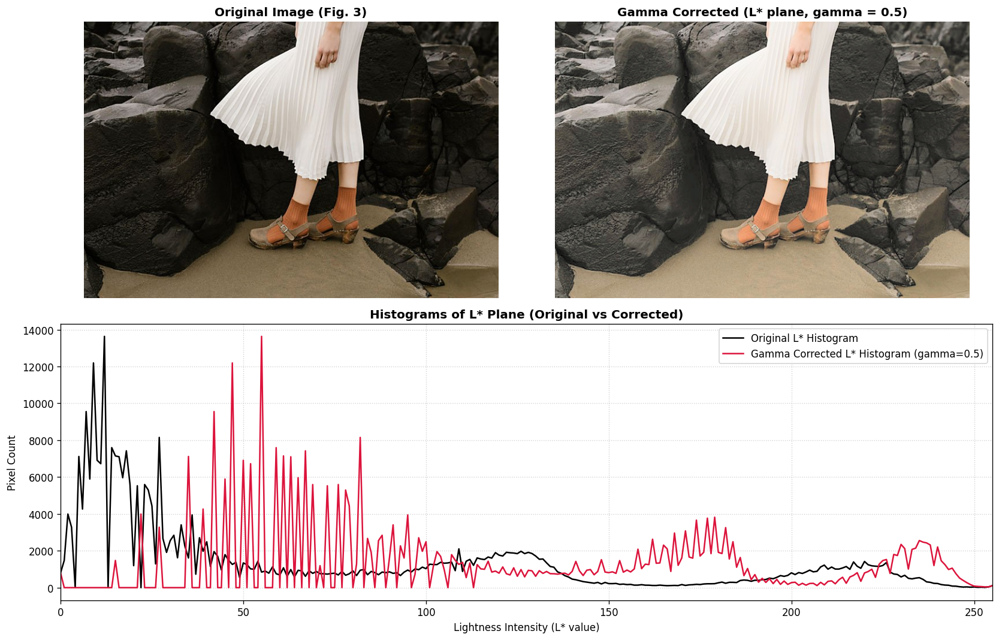

In [4]:
def gamma_correction_lab(bgr_img: np.ndarray, gamma: float = 0.5):
    lab_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2LAB)
    L, a, b = cv2.split(lab_img)
    
    r_range = np.arange(256, dtype=np.float64)
    lut_gamma = np.clip(255.0 * ((r_range / 255.0) ** gamma), 0, 255).astype(np.uint8)
    
    L_corrected = cv2.LUT(L, lut_gamma)
    lab_corrected = cv2.merge([L_corrected, a, b])
    bgr_corrected = cv2.cvtColor(lab_corrected, cv2.COLOR_LAB2BGR)
    
    return bgr_corrected, L, L_corrected

fig3_path = os.path.join("images", "Fig3.jpeg")
bgr_img3 = cv2.imread(fig3_path)

gamma_val = 0.5
bgr_corr, L_orig, L_corr = gamma_correction_lab(bgr_img3, gamma=gamma_val)

rgb_orig3 = cv2.cvtColor(bgr_img3, cv2.COLOR_BGR2RGB)
rgb_corr3 = cv2.cvtColor(bgr_corr, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize=(14, 9))

ax1 = fig.add_subplot(2, 2, 1)
ax1.imshow(rgb_orig3)
ax1.set_title('Original Image (Fig. 3)', fontweight='bold')
ax1.axis('off')

ax2 = fig.add_subplot(2, 2, 2)
ax2.imshow(rgb_corr3)
ax2.set_title(f'Gamma Corrected (L* plane, gamma = {gamma_val})', fontweight='bold')
ax2.axis('off')

ax3 = fig.add_subplot(2, 1, 2)
hist_orig = cv2.calcHist([L_orig], [0], None, [256], [0, 256])
hist_corr = cv2.calcHist([L_corr], [0], None, [256], [0, 256])

ax3.plot(hist_orig, color='black', label='Original L* Histogram')
ax3.plot(hist_corr, color='crimson', label=f'Gamma Corrected L* Histogram (gamma={gamma_val})')
ax3.set_xlim([0, 255])
ax3.set_xlabel('Lightness Intensity (L* value)')
ax3.set_ylabel('Pixel Count')
ax3.set_title('Histograms of L* Plane (Original vs Corrected)', fontweight='bold')
ax3.grid(True, linestyle=':', alpha=0.6)
ax3.legend()

plt.tight_layout()
plt.show()


---
## Question 4: Color Vibrance Enhancement in HSV Space

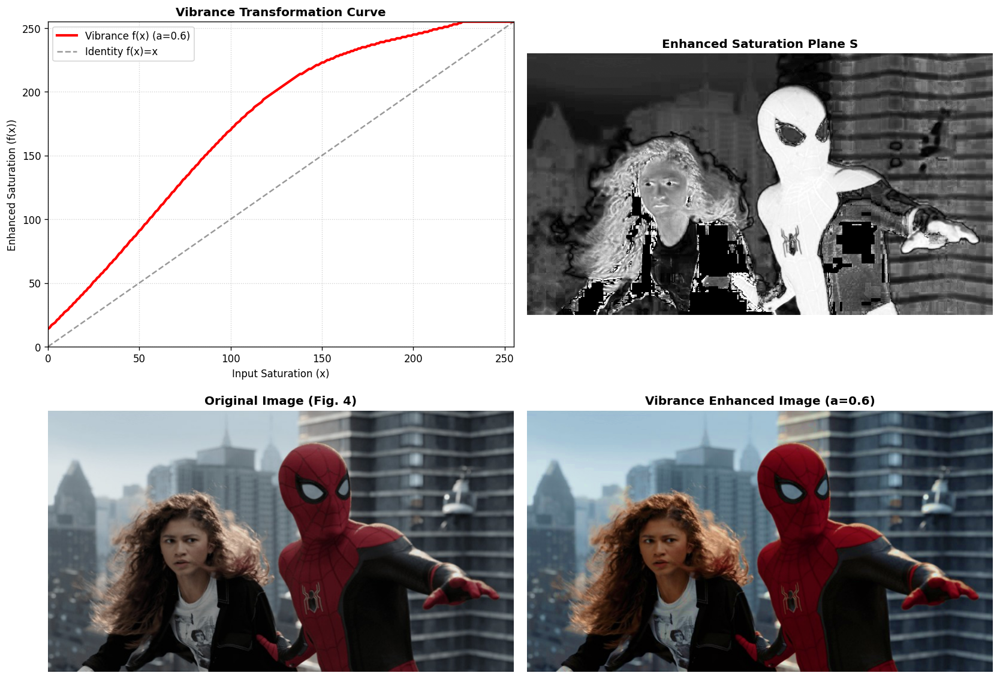

In [5]:
def vibrance_transform(x: np.ndarray, a: float, sigma: float = 70.0) -> np.ndarray:
    x_float = x.astype(np.float64)
    gaussian_boost = a * 128.0 * np.exp(- ((x_float - 128.0) ** 2) / (2.0 * (sigma ** 2)))
    fx = x_float + gaussian_boost
    return np.clip(fx, 0, 255).astype(np.uint8)

fig4_path = os.path.join("images", "Fig4.jpeg")
bgr_img4 = cv2.imread(fig4_path)

hsv_img = cv2.cvtColor(bgr_img4, cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(hsv_img)

a_param = 0.6
sigma_param = 70.0
S_enhanced = vibrance_transform(S, a=a_param, sigma=sigma_param)

hsv_enhanced = cv2.merge([H, S_enhanced, V])
bgr_enhanced = cv2.cvtColor(hsv_enhanced, cv2.COLOR_HSV2BGR)

rgb_orig4 = cv2.cvtColor(bgr_img4, cv2.COLOR_BGR2RGB)
rgb_enh4  = cv2.cvtColor(bgr_enhanced, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize=(14, 10))

x_vals = np.arange(256, dtype=np.float64)
fx_vals = vibrance_transform(x_vals, a=a_param, sigma=sigma_param)

ax_curve = fig.add_subplot(2, 2, 1)
ax_curve.plot(x_vals, fx_vals, 'r-', linewidth=2.5, label=f'Vibrance f(x) (a={a_param})')
ax_curve.plot([0, 255], [0, 255], 'k--', alpha=0.4, label='Identity f(x)=x')
ax_curve.set_xlim([0, 255]); ax_curve.set_ylim([0, 255])
ax_curve.set_xlabel('Input Saturation (x)')
ax_curve.set_ylabel('Enhanced Saturation (f(x))')
ax_curve.set_title('Vibrance Transformation Curve', fontweight='bold')
ax_curve.grid(True, linestyle=':', alpha=0.6)
ax_curve.legend()

ax_sat = fig.add_subplot(2, 2, 2)
ax_sat.imshow(S_enhanced, cmap='gray')
ax_sat.set_title('Enhanced Saturation Plane S', fontweight='bold')
ax_sat.axis('off')

ax_orig = fig.add_subplot(2, 2, 3)
ax_orig.imshow(rgb_orig4)
ax_orig.set_title('Original Image (Fig. 4)', fontweight='bold')
ax_orig.axis('off')

ax_enh = fig.add_subplot(2, 2, 4)
ax_enh.imshow(rgb_enh4)
ax_enh.set_title(f'Vibrance Enhanced Image (a={a_param})', fontweight='bold')
ax_enh.axis('off')

plt.tight_layout()
plt.show()


---
## Question 5: Custom Discrete Histogram Equalization


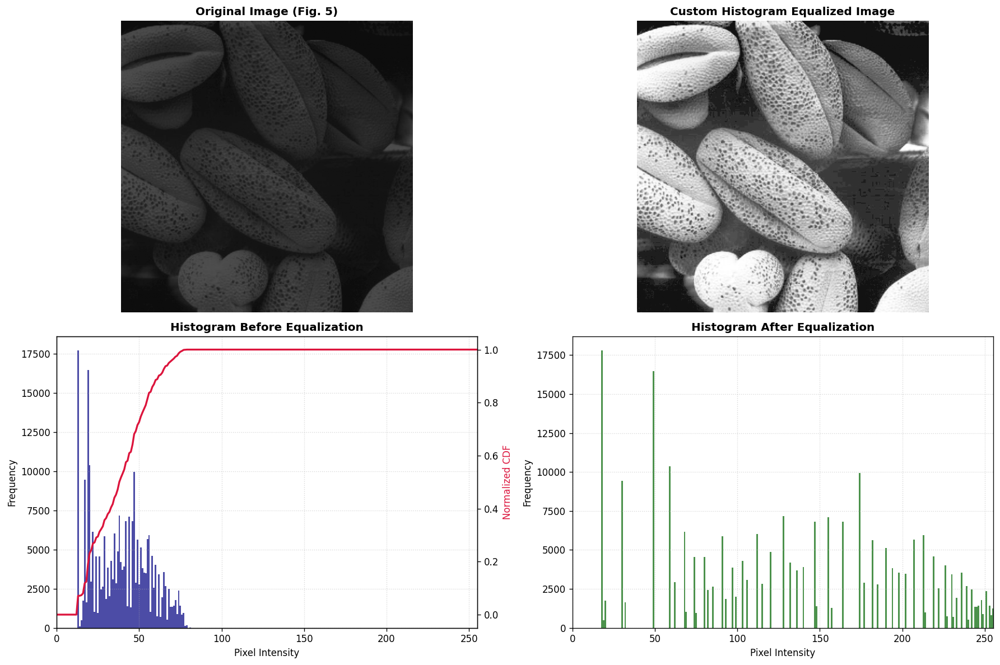

In [6]:
def custom_histogram_equalization(im: np.ndarray):
    im_uint8 = np.clip(im, 0, 255).astype(np.uint8)
    num_pixels = im_uint8.size
    
    hist_before = np.bincount(im_uint8.ravel(), minlength=256)
    pmf = hist_before / num_pixels
    cdf = np.cumsum(pmf)
    
    lut = np.round(255.0 * cdf).astype(np.uint8)
    equalized_im = lut[im_uint8]
    hist_after = np.bincount(equalized_im.ravel(), minlength=256)
    
    return equalized_im, hist_before, hist_after, cdf

fig5_path = os.path.join("images", "Fig5.tif")
img_q5 = cv2.imread(fig5_path, cv2.IMREAD_GRAYSCALE)

eq_img, hist_before, hist_after, cdf = custom_histogram_equalization(img_q5)

fig = plt.figure(figsize=(15, 10))

ax1 = fig.add_subplot(2, 2, 1)
ax1.imshow(img_q5, cmap='gray', vmin=0, vmax=255)
ax1.set_title('Original Image (Fig. 5)', fontweight='bold')
ax1.axis('off')

ax2 = fig.add_subplot(2, 2, 2)
ax2.imshow(eq_img, cmap='gray', vmin=0, vmax=255)
ax2.set_title('Custom Histogram Equalized Image', fontweight='bold')
ax2.axis('off')

ax3 = fig.add_subplot(2, 2, 3)
r_vals = np.arange(256)
ax3.bar(r_vals, hist_before, color='navy', width=1.0, alpha=0.7, label='Histogram Before')
ax3.set_xlim([0, 255])
ax3.set_xlabel('Pixel Intensity')
ax3.set_ylabel('Frequency')
ax3.set_title('Histogram Before Equalization', fontweight='bold')
ax3.grid(True, linestyle=':', alpha=0.5)

ax3_cdf = ax3.twinx()
ax3_cdf.plot(r_vals, cdf, color='crimson', linewidth=2.0, label='CDF')
ax3_cdf.set_ylabel('Normalized CDF', color='crimson')

ax4 = fig.add_subplot(2, 2, 4)
ax4.bar(r_vals, hist_after, color='darkgreen', width=1.0, alpha=0.7)
ax4.set_xlim([0, 255])
ax4.set_xlabel('Pixel Intensity')
ax4.set_ylabel('Frequency')
ax4.set_title('Histogram After Equalization', fontweight='bold')
ax4.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()


---
## Question 6: Foreground Histogram Equalization in HSV Space

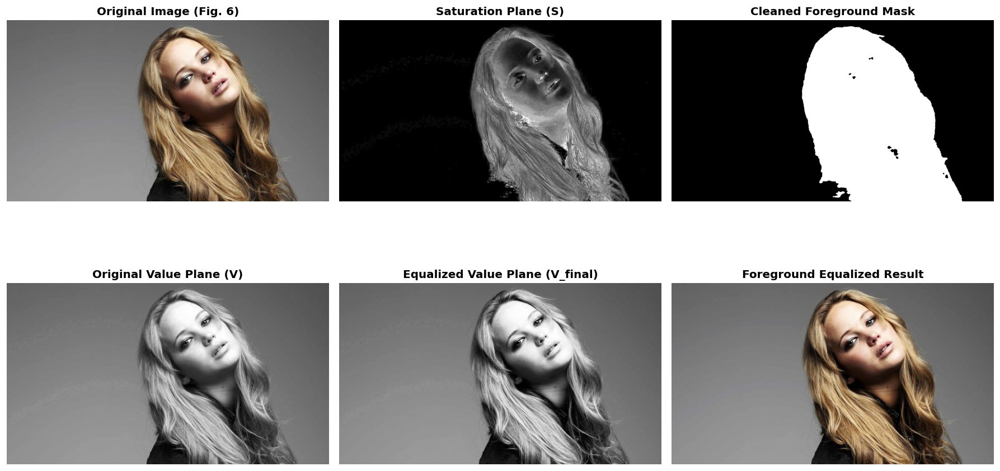

In [7]:
fig6_path = os.path.join("images", "Fig6.jpeg")
bgr_img6 = cv2.imread(fig6_path)

hsv6 = cv2.cvtColor(bgr_img6, cv2.COLOR_BGR2HSV)
H6, S6, V6 = cv2.split(hsv6)

thresh_val = 15
_, mask_raw = cv2.threshold(S6, thresh_val, 255, cv2.THRESH_BINARY)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
mask = cv2.morphologyEx(mask_raw, cv2.MORPH_CLOSE, kernel)
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

fg_pixels = V6[mask > 0]
num_fg_pixels = fg_pixels.size
hist_fg = np.bincount(fg_pixels, minlength=256)
cdf_fg = np.cumsum(hist_fg)

cdf_min = cdf_fg[cdf_fg > 0].min() if np.any(cdf_fg > 0) else 0
lut_fg = np.round(255.0 * (cdf_fg - cdf_min) / (num_fg_pixels - cdf_min + 1e-6))
lut_fg = np.clip(lut_fg, 0, 255).astype(np.uint8)

V_eq = lut_fg[V6]
V_fg_eq = cv2.bitwise_and(V_eq, V_eq, mask=mask)

mask_bg = cv2.bitwise_not(mask)
V_bg = cv2.bitwise_and(V6, V6, mask=mask_bg)
V_final = cv2.add(V_bg, V_fg_eq)

hsv_final = cv2.merge([H6, S6, V_final])
bgr_final = cv2.cvtColor(hsv_final, cv2.COLOR_HSV2BGR)

rgb_orig6  = cv2.cvtColor(bgr_img6, cv2.COLOR_BGR2RGB)
rgb_final6 = cv2.cvtColor(bgr_final, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(2, 3, figsize=(15, 9))

axes[0, 0].imshow(rgb_orig6)
axes[0, 0].set_title('Original Image (Fig. 6)', fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(S6, cmap='gray')
axes[0, 1].set_title('Saturation Plane (S)', fontweight='bold')
axes[0, 1].axis('off')

axes[0, 2].imshow(mask, cmap='gray')
axes[0, 2].set_title('Cleaned Foreground Mask', fontweight='bold')
axes[0, 2].axis('off')

axes[1, 0].imshow(V6, cmap='gray')
axes[1, 0].set_title('Original Value Plane (V)', fontweight='bold')
axes[1, 0].axis('off')

axes[1, 1].imshow(V_final, cmap='gray')
axes[1, 1].set_title('Equalized Value Plane (V_final)', fontweight='bold')
axes[1, 1].axis('off')

axes[1, 2].imshow(rgb_final6)
axes[1, 2].set_title('Foreground Equalized Result', fontweight='bold')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


---
## Question 7: 2D Spatial & 1D Separable Sobel Kernel Filtering

OpenCV filter2D execution time: 2.99 ms
Custom 2D conv execution time  : 28.40 ms
Custom 1D sep conv execution   : 113.32 ms
Max Absolute Error (2D vs Sep) : 0.00e+00


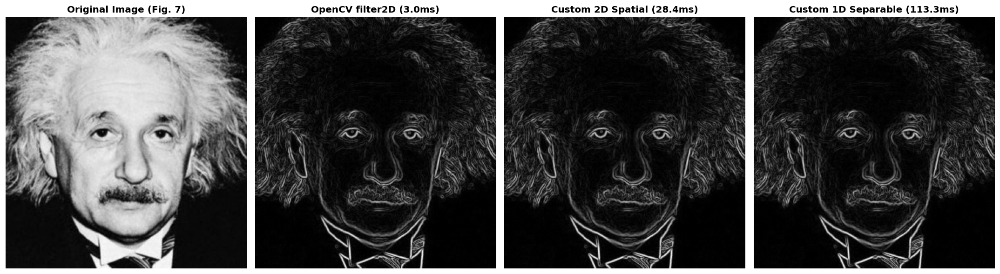

In [8]:
def custom_conv2d(img: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    img_f = img.astype(np.float64)
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2
    padded = np.pad(img_f, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
    output = np.zeros_like(img_f)
    for m in range(kh):
        for n in range(kw):
            output += kernel[m, n] * padded[m:m + img_f.shape[0], n:n + img_f.shape[1]]
    return output

def custom_separable_filter(img: np.ndarray, col_kernel: np.ndarray, row_kernel: np.ndarray) -> np.ndarray:
    img_f = img.astype(np.float64)
    kw = row_kernel.shape[1]
    pad_w = kw // 2
    padded_row = np.pad(img_f, ((0, 0), (pad_w, pad_w)), mode='reflect')
    row_filtered = np.zeros_like(img_f)
    for n in range(kw):
        row_filtered += row_kernel[0, n] * padded_row[:, n:n + img_f.shape[1]]
        
    kh = col_kernel.shape[0]
    pad_h = kh // 2
    padded_col = np.pad(row_filtered, ((pad_h, pad_h), (0, 0)), mode='reflect')
    output = np.zeros_like(img_f)
    for m in range(kh):
        output += col_kernel[m, 0] * padded_col[m:m + img_f.shape[0], :]
    return output

fig7_path = os.path.join("images", "Fig7.jpeg")
img7 = cv2.imread(fig7_path, cv2.IMREAD_GRAYSCALE)

Kx = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]], dtype=np.float64)
Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype=np.float64)

col_x, row_x = np.array([[1], [2], [1]]), np.array([[1, 0, -1]])
col_y, row_y = np.array([[1], [0], [-1]]), np.array([[1, 2, 1]])

t0 = time.time(); gx_a = cv2.filter2D(img7, cv2.CV_64F, Kx); gy_a = cv2.filter2D(img7, cv2.CV_64F, Ky); t_a = time.time() - t0
t0 = time.time(); gx_b = custom_conv2d(img7, Kx); gy_b = custom_conv2d(img7, Ky); t_b = time.time() - t0
t0 = time.time(); gx_c = custom_separable_filter(img7, col_x, row_x); gy_c = custom_separable_filter(img7, col_y, row_y); t_c = time.time() - t0

mag_a = np.sqrt(gx_a**2 + gy_a**2)
mag_b = np.sqrt(gx_b**2 + gy_b**2)
mag_c = np.sqrt(gx_c**2 + gy_c**2)

print(f"OpenCV filter2D execution time: {t_a*1000:.2f} ms")
print(f"Custom 2D conv execution time  : {t_b*1000:.2f} ms")
print(f"Custom 1D sep conv execution   : {t_c*1000:.2f} ms")
print(f"Max Absolute Error (2D vs Sep) : {np.max(np.abs(mag_b - mag_c)):.2e}")

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(img7, cmap='gray')
axes[0].set_title('Original Image (Fig. 7)', fontweight='bold')
axes[0].axis('off')

axes[1].imshow(mag_a, cmap='gray')
axes[1].set_title(f'OpenCV filter2D ({t_a*1000:.1f}ms)', fontweight='bold')
axes[1].axis('off')

axes[2].imshow(mag_b, cmap='gray')
axes[2].set_title(f'Custom 2D Spatial ({t_b*1000:.1f}ms)', fontweight='bold')
axes[2].axis('off')

axes[3].imshow(mag_c, cmap='gray')
axes[3].set_title(f'Custom 1D Separable ({t_c*1000:.1f}ms)', fontweight='bold')
axes[3].axis('off')

plt.tight_layout()
plt.show()


---
## Question 8: Image Zooming (Nearest-Neighbor & Bilinear Interpolation)


Image 1 (im01):
  Nearest-Neighbor : Norm SSD = 0.012058 | PSNR = 26.79 dB
  Bilinear Interp  : Norm SSD = 0.010187 | PSNR = 27.52 dB


Image 2 (im02):
  Nearest-Neighbor : Norm SSD = 0.004190 | PSNR = 33.91 dB
  Bilinear Interp  : Norm SSD = 0.002911 | PSNR = 35.49 dB


Image 3 (im03):
  Nearest-Neighbor : Norm SSD = 0.007668 | PSNR = 29.83 dB
  Bilinear Interp  : Norm SSD = 0.005811 | PSNR = 31.04 dB
Image 4 (im04):
  Nearest-Neighbor : Norm SSD = 0.005354 | PSNR = 24.54 dB
  Bilinear Interp  : Norm SSD = 0.004628 | PSNR = 25.17 dB


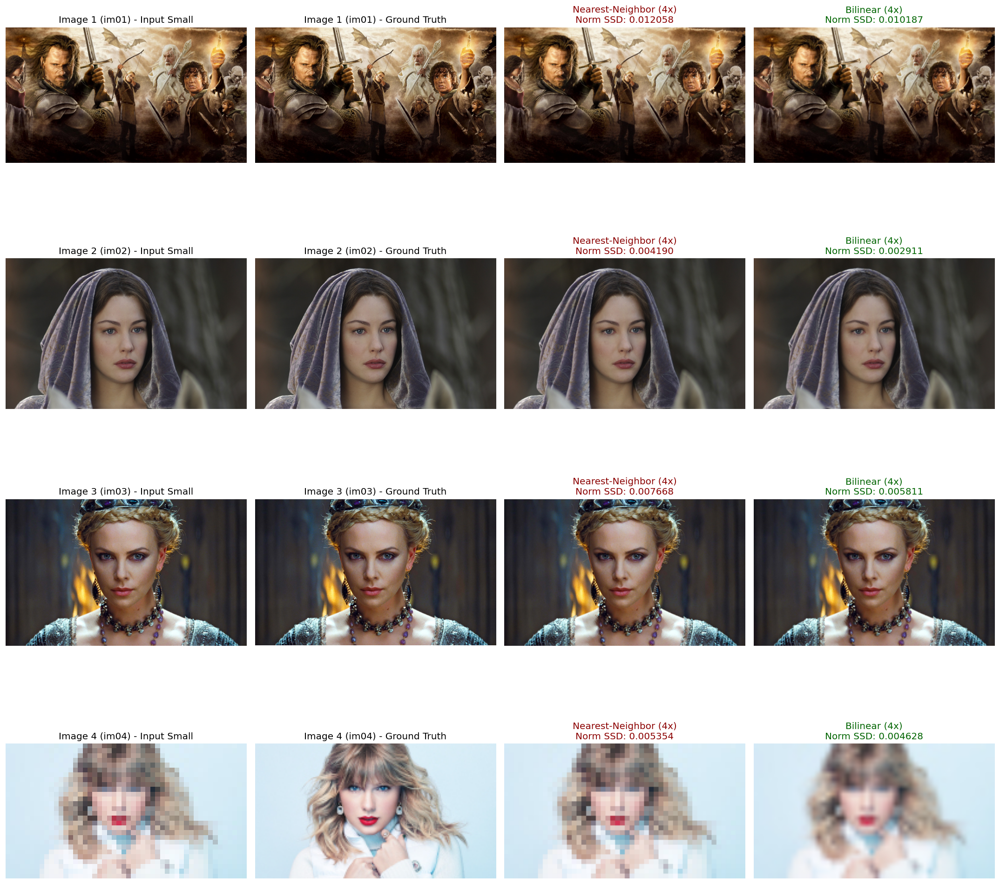

In [9]:
def zoom_image(img: np.ndarray, s: float, method: str = 'bilinear') -> np.ndarray:
    if not (0 < s <= 10):
        raise ValueError(f"Scale factor s must be in (0, 10], got s = {s}")
        
    method_lower = method.lower().strip()
    H, W = img.shape[:2]
    H_out, W_out = int(round(H * s)), int(round(W * s))
    
    y_out = np.arange(H_out, dtype=np.float64)
    x_out = np.arange(W_out, dtype=np.float64)
    
    y_in = np.clip((y_out + 0.5) / s - 0.5, 0, H - 1)
    x_in = np.clip((x_out + 0.5) / s - 0.5, 0, W - 1)
    
    if method_lower in ['nearest', 'nearest-neighbor']:
        r_in = np.clip(np.floor(y_in + 0.5).astype(int), 0, H - 1)
        c_in = np.clip(np.floor(x_in + 0.5).astype(int), 0, W - 1)
        return img[np.ix_(r_in, c_in)] if img.ndim == 2 else img[r_in[:, None], c_in[None, :]]
        
    else:  # bilinear
        y0 = np.floor(y_in).astype(int)
        x0 = np.floor(x_in).astype(int)
        y1 = np.clip(y0 + 1, 0, H - 1)
        x1 = np.clip(x0 + 1, 0, W - 1)
        
        dy = (y_in - y0)[:, None]
        dx = (x_in - x0)[None, :]
        if img.ndim == 3:
            dy = dy[:, :, None]
            dx = dx[:, :, None]
            
        I00 = img[y0[:, None], x0[None, :]].astype(np.float64)
        I01 = img[y0[:, None], x1[None, :]].astype(np.float64)
        I10 = img[y1[:, None], x0[None, :]].astype(np.float64)
        I11 = img[y1[:, None], x1[None, :]].astype(np.float64)
        
        interp = (1 - dy) * ((1 - dx) * I00 + dx * I01) + dy * ((1 - dx) * I10 + dx * I11)
        return np.clip(np.round(interp), 0, 255).astype(img.dtype)

def compute_metrics(orig: np.ndarray, zoomed: np.ndarray):
    min_h = min(orig.shape[0], zoomed.shape[0])
    min_w = min(orig.shape[1], zoomed.shape[1])
    o_c = orig[:min_h, :min_w].astype(np.float64)
    z_c = zoomed[:min_h, :min_w].astype(np.float64)
    diff = o_c - z_c
    ssd_norm = float(np.sum(diff**2) / np.sum(o_c**2))
    mse = float(np.mean(diff**2))
    psnr = 100.0 if mse == 0 else float(10.0 * np.log10((255.0**2) / mse))
    return ssd_norm, mse, psnr

image_pairs = [
    ("im01.png", "im01small.png", "Image 1 (im01)"),
    ("im02.png", "im02small.png", "Image 2 (im02)"),
    ("im03.png", "im03small.png", "Image 3 (im03)"),
    ("im04.jpg", "im04small.jpg", "Image 4 (im04)")
]

fig, axes = plt.subplots(len(image_pairs), 4, figsize=(18, 4.5 * len(image_pairs)))

for idx, (orig_file, small_file, label) in enumerate(image_pairs):
    orig_bgr  = cv2.imread(os.path.join("images", orig_file))
    small_bgr = cv2.imread(os.path.join("images", small_file))
    
    nn_zoomed = zoom_image(small_bgr, s=4.0, method='nearest')
    bl_zoomed = zoom_image(small_bgr, s=4.0, method='bilinear')
    
    ssd_nn, mse_nn, psnr_nn = compute_metrics(orig_bgr, nn_zoomed)
    ssd_bl, mse_bl, psnr_bl = compute_metrics(orig_bgr, bl_zoomed)
    
    print(f"{label}:")
    print(f"  Nearest-Neighbor : Norm SSD = {ssd_nn:.6f} | PSNR = {psnr_nn:.2f} dB")
    print(f"  Bilinear Interp  : Norm SSD = {ssd_bl:.6f} | PSNR = {psnr_bl:.2f} dB")
    
    axes[idx, 0].imshow(cv2.cvtColor(small_bgr, cv2.COLOR_BGR2RGB))
    axes[idx, 0].set_title(f"{label} - Input Small")
    axes[idx, 0].axis('off')
    
    axes[idx, 1].imshow(cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2RGB))
    axes[idx, 1].set_title(f"{label} - Ground Truth")
    axes[idx, 1].axis('off')
    
    axes[idx, 2].imshow(cv2.cvtColor(nn_zoomed, cv2.COLOR_BGR2RGB))
    axes[idx, 2].set_title(f"Nearest-Neighbor (4x)\nNorm SSD: {ssd_nn:.6f}", color='darkred')
    axes[idx, 2].axis('off')
    
    axes[idx, 3].imshow(cv2.cvtColor(bl_zoomed, cv2.COLOR_BGR2RGB))
    axes[idx, 3].set_title(f"Bilinear (4x)\nNorm SSD: {ssd_bl:.6f}", color='darkgreen')
    axes[idx, 3].axis('off')

plt.tight_layout()
plt.show()


---
## Question 9: GrabCut Foreground Segmentation & Synthetic Bokeh Effect

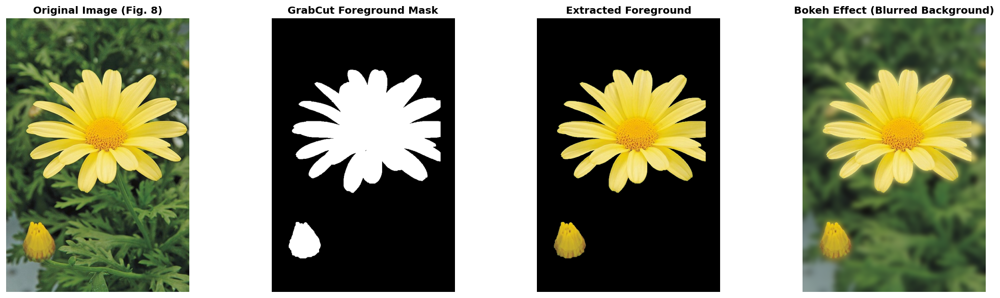

In [10]:
fig8_path = os.path.join("images", "Fig8.jpeg")
bgr_img8 = cv2.imread(fig8_path)
H, W = bgr_img8.shape[:2]

margin_x = int(W * 0.08)
margin_y = int(H * 0.08)
rect = (margin_x, margin_y, W - 2 * margin_x, H - 2 * margin_y)

mask8 = np.zeros((H, W), dtype=np.uint8)
bgdModel = np.zeros((1, 65), dtype=np.float64)
fgdModel = np.zeros((1, 65), dtype=np.float64)

cv2.grabCut(bgr_img8, mask8, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

fg_mask = np.where((mask8 == 1) | (mask8 == 3), 1, 0).astype(np.uint8)
bg_mask = 1 - fg_mask

blurred_bg = cv2.GaussianBlur(bgr_img8, (51, 51), 0)
fg_mask_3ch = np.repeat(fg_mask[:, :, np.newaxis], 3, axis=2)
enhanced_bgr = np.where(fg_mask_3ch == 1, bgr_img8, blurred_bg)

rgb_orig8 = cv2.cvtColor(bgr_img8, cv2.COLOR_BGR2RGB)
rgb_fg8   = cv2.cvtColor(cv2.bitwise_and(bgr_img8, bgr_img8, mask=fg_mask), cv2.COLOR_BGR2RGB)
rgb_bg8   = cv2.cvtColor(cv2.bitwise_and(bgr_img8, bgr_img8, mask=bg_mask), cv2.COLOR_BGR2RGB)
rgb_enh8  = cv2.cvtColor(enhanced_bgr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(rgb_orig8)
axes[0].set_title('Original Image (Fig. 8)', fontweight='bold')
axes[0].axis('off')

axes[1].imshow(fg_mask * 255, cmap='gray')
axes[1].set_title('GrabCut Foreground Mask', fontweight='bold')
axes[1].axis('off')

axes[2].imshow(rgb_fg8)
axes[2].set_title('Extracted Foreground', fontweight='bold')
axes[2].axis('off')

axes[3].imshow(rgb_enh8)
axes[3].set_title('Bokeh Effect (Blurred Background)', fontweight='bold')
axes[3].axis('off')

plt.tight_layout()
plt.show()


---
## Question 10: Custom Bilateral Filtering & Parameter Study

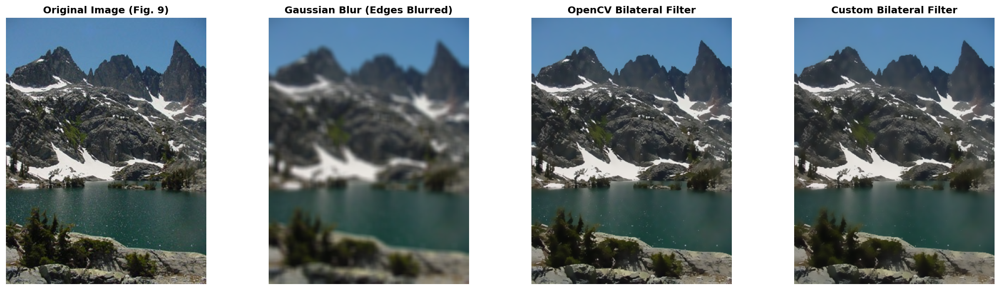

In [11]:
def custom_bilateral_filter(img: np.ndarray, d: int, sigma_s: float, sigma_r: float) -> np.ndarray:
    img_f = img.astype(np.float64)
    radius = d // 2
    
    y_grid, x_grid = np.meshgrid(np.arange(-radius, radius + 1), np.arange(-radius, radius + 1), indexing='ij')
    spatial_dist_sq = x_grid**2 + y_grid**2
    spatial_weights = np.exp(- spatial_dist_sq / (2.0 * (sigma_s ** 2)))
    
    is_color = (img.ndim == 3)
    padded = np.pad(img_f, ((radius, radius), (radius, radius), (0, 0)) if is_color else ((radius, radius), (radius, radius)), mode='reflect')
    
    H, W = img.shape[:2]
    output = np.zeros_like(img_f)
    norm_factor = np.zeros((H, W, 3) if is_color else (H, W), dtype=np.float64)
    
    for dy in range(-radius, radius + 1):
        for dx in range(-radius, radius + 1):
            neighbor_patch = padded[radius + dy : radius + dy + H, radius + dx : radius + dx + W]
            w_spatial = spatial_weights[dy + radius, dx + radius]
            
            if is_color:
                diff_sq = np.sum((neighbor_patch - img_f) ** 2, axis=2, keepdims=True)
            else:
                diff_sq = (neighbor_patch - img_f) ** 2
                
            w_range = np.exp(- diff_sq / (2.0 * (sigma_r ** 2)))
            w_combined = w_spatial * w_range
            
            output += w_combined * neighbor_patch
            norm_factor += w_combined

    return np.clip(np.round(output / (norm_factor + 1e-8)), 0, 255).astype(np.uint8)

fig9_path = os.path.join("images", "Fig9.jpeg")
bgr_img9 = cv2.imread(fig9_path)

d = 9
sigma_s = 5.0
sigma_r = 45.0

cv_gauss = cv2.GaussianBlur(bgr_img9, (d, d), sigmaX=sigma_s, sigmaY=sigma_s)
cv_bilat = cv2.bilateralFilter(bgr_img9, d=d, sigmaColor=sigma_r, sigmaSpace=sigma_s)
custom_bi = custom_bilateral_filter(bgr_img9, d=d, sigma_s=sigma_s, sigma_r=sigma_r)

rgb_orig9  = cv2.cvtColor(bgr_img9, cv2.COLOR_BGR2RGB)
rgb_gauss9 = cv2.cvtColor(cv_gauss, cv2.COLOR_BGR2RGB)
rgb_cvbi9  = cv2.cvtColor(cv_bilat, cv2.COLOR_BGR2RGB)
rgb_cust9  = cv2.cvtColor(custom_bi, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(rgb_orig9)
axes[0].set_title('Original Image (Fig. 9)', fontweight='bold')
axes[0].axis('off')

axes[1].imshow(rgb_gauss9)
axes[1].set_title('Gaussian Blur (Edges Blurred)', fontweight='bold')
axes[1].axis('off')

axes[2].imshow(rgb_cvbi9)
axes[2].set_title('OpenCV Bilateral Filter', fontweight='bold')
axes[2].axis('off')

axes[3].imshow(rgb_cust9)
axes[3].set_title('Custom Bilateral Filter', fontweight='bold')
axes[3].axis('off')

plt.tight_layout()
plt.show()
